In [1]:
# !pip install --quiet -r requirements.txt

# TODO
- Image retrieval: given an image, find 10 closest images
- Metrics of goodness for the number of centroids
- What is the complexity of inference with respect to batch size
- Image captioning 

In [3]:
# for loading/processing the images  
from tensorflow.keras.utils import load_img, img_to_array
from keras.applications.vgg16 import preprocess_input 

# models 
from keras.applications.vgg16 import VGG16 
from keras.models import Model

# clustering and dimension reduction
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# for everything else
import os
import numpy as np
import matplotlib.pyplot as plt
from random import randint
import pandas as pd
import pickle
from pathlib import Path
from tqdm.notebook import tqdm # tqdm.notebook.tqdm

2023-06-16 16:59:50.462712: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


# Load file names

In [4]:
folder_path = Path('/Users/D071576/Downloads/flowers/flowers/')

# this list holds all the image filename
flowers = []

# creates a ScandirIterator aliased as files
with os.scandir(folder_path) as files:
  # loops through each file in the directory
    for file in tqdm(files):
        if file.name.endswith('.png'):
          # adds only the image files to the flowers list
            flowers.append(file.name)
print(f"Number of files {len(flowers)}")

0it [00:00, ?it/s]

Number of files 603


# Utilities function to view images

Clipping cluster size from 46 to 30


loading images:   0%|          | 0/29 [00:00<?, ?it/s]

plotting images: 0it [00:00, ?it/s]

/var/folders/x9/97hf95597gz40x1011pr67fh0000gn/T/ipykernel_5069/3768903258.py:18: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(10,10,index+1)


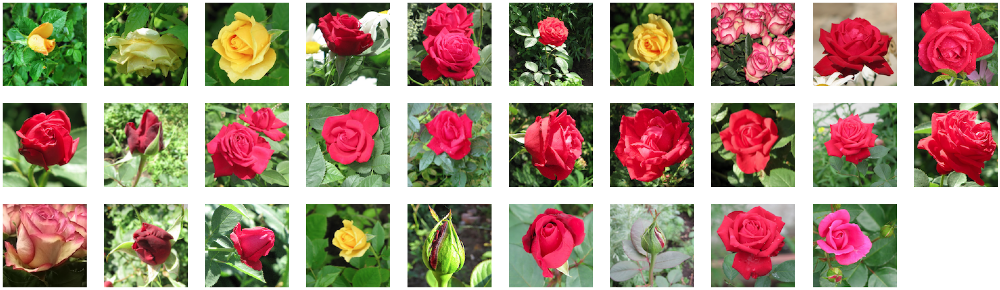

In [179]:
# function that lets you view a cluster (based on identifier)        
def view_cluster(cluster):
    # gets the list of filenames for a cluster
    assert cluster in groups.keys(), f"cluster = {cluster} not found in groups.keys()=(groups.keys())"
    files = groups[cluster]
    read_and_show_images(files)
    
def load_images(file_paths):
    images = []
    for file_path in tqdm(file_paths,desc="loading images"):
        images.append(np.array(load_img(file_path)))
    return images

def show_images(images, title=None):
    plt.figure(figsize = (50,50))
    plt.title(title) 
    for index, image in tqdm(enumerate(images), desc="plotting images"):
        plt.subplot(10,10,index+1)
        plt.imshow(image)
        plt.axis('off')
    
def read_and_show_images(files):
    # only allow up to 30 images to be shown at a time
    if len(files) > 30:
        print(f"Clipping cluster size from {len(files)} to 30")
        files = files[:29]
    file_paths = [folder_path / file for file in files]
    images = load_images(file_paths)
    show_images(images)

def get_flowers_file_names(flower_id):
    ans = [flower for flower in flowers if flower.startswith(flower_id)]
    return ans
read_and_show_images(get_flowers(flower_id="01"))

# The model

In [8]:
# load model
model = VGG16()
# remove the output layer
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)

In [9]:
file_name = flowers[0]

In [135]:
def read_all_images(folder_path):
    ans = []
    for file_path in tqdm(folder_path.glob("*.png")):
        # load the image as a 224x224 array
        img = load_img(file_path, target_size=(224,224))
        # convert from 'PIL.Image.Image' to numpy array
        ans.append(np.array(img))
    return np.stack(ans, axis=0)
X = read_all_images(folder_path=folder_path)
X.shape

0it [00:00, ?it/s]

(603, 224, 224, 3)

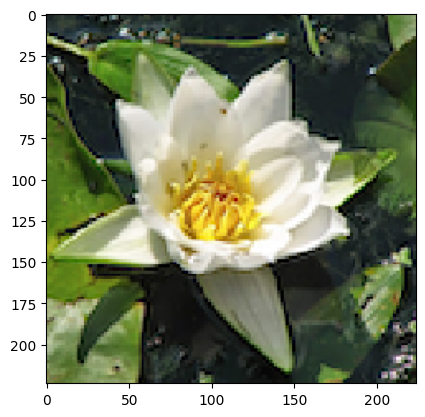

In [136]:
imgplot = plt.imshow(X[1])

# Extracting features for all files

In [180]:
imgx = preprocess_input(X)
# get the feature vector
features = model.predict(imgx, use_multiprocessing=True, batch_size=100)
# Batch here default 32

7/7 [==============================] - 37s 5s/step


In [181]:
pca = PCA(n_components=500, random_state=22)
pca.fit(features)
PCA_features = pca.transform(features)
PCA_features.shape

(603, 500)

In [182]:
# cluster feature vectors
k_means_params = {
    "n_clusters": 18,
    "random_state": 22, 
    "n_init": 10
}
kmeans = KMeans(**k_means_params)
kmeans.fit(PCA_features)

KMeans(n_clusters=18, n_init=10, random_state=22)

In [183]:
# holds the cluster id and the images { id: [images] }
groups = {}
for file, cluster in zip(flowers,kmeans.labels_):
    if cluster not in groups.keys():
        groups[cluster] = []
        groups[cluster].append(file)
    else:
        groups[cluster].append(file)


loading images:   0%|          | 0/17 [00:00<?, ?it/s]

plotting images: 0it [00:00, ?it/s]

/var/folders/x9/97hf95597gz40x1011pr67fh0000gn/T/ipykernel_5069/3768903258.py:18: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(10,10,index+1)


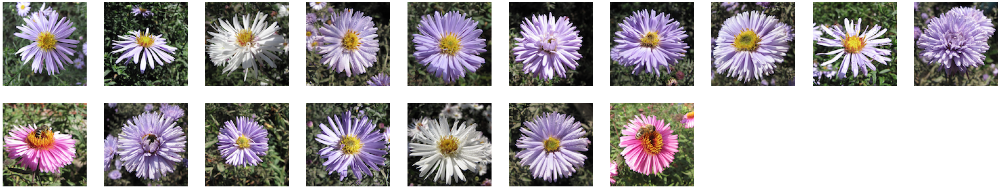

In [184]:
view_cluster(1)

loading images:   0%|          | 0/26 [00:00<?, ?it/s]

plotting images: 0it [00:00, ?it/s]

/var/folders/x9/97hf95597gz40x1011pr67fh0000gn/T/ipykernel_5069/3768903258.py:18: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(10,10,index+1)


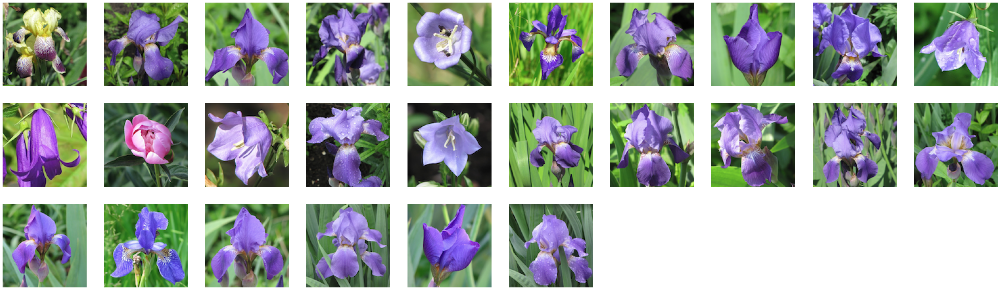

In [186]:
view_cluster(3)